


# PART 0





In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
# constant initialization

import numpy as np
import pandas as pd
import matplotlib


# PART 1


In [ ]:
# libraries
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer


In [ ]:
# Load data
data=pd.read_csv("/content/Airplane.csv")
data = data.dropna()
data.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [ ]:
print(len(data))

print(type(data))

103594
<class 'pandas.core.frame.DataFrame'>


In [ ]:
# Creating labelEncoder
label = preprocessing.LabelEncoder()

# Converting string labels into numbers.
data['Gender']=label.fit_transform(data['Gender'])
data['Customer Type']=label.fit_transform(data['Customer Type'])
data['Type of Travel']=label.fit_transform(data['Type of Travel'])
data['Class']=label.fit_transform(data['Class'])
data['satisfaction']=label.fit_transform(data['satisfaction'])


<ipython-input-34-f341fec3ab89>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Gender']=label.fit_transform(data['Gender'])
<ipython-input-34-f341fec3ab89>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Customer Type']=label.fit_transform(data['Customer Type'])
<ipython-input-34-f341fec3ab89>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

In [ ]:
data.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,1,0,13,1,2,460,3,4,...,5,4,3,4,4,5,5,25,18.0,0
1,1,5047,1,1,25,0,0,235,3,2,...,1,1,5,3,1,4,1,1,6.0,0
2,2,110028,0,0,26,0,0,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,1
3,3,24026,0,0,25,0,0,562,2,5,...,2,2,5,3,1,4,2,11,9.0,0
4,4,119299,1,0,61,0,0,214,3,3,...,3,3,4,4,3,3,3,0,0.0,1


In [ ]:
# Separate features and target variable

x = data[['Gender', 'Customer Type', 'Age', 'Type of Travel', 'Class', 'Flight Distance',
        'Inflight wifi service', 'Departure/Arrival time convenient', 'Ease of Online booking',
        'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort', 'Inflight entertainment',
        'On-board service', 'Leg room service', 'Baggage handling', 'Checkin service', 'Inflight service',
        'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']]
y = data['satisfaction']


# Impute missing values
imputer = SimpleImputer(strategy='constant')  # You can choose a different strategy if needed
x_imputed = imputer.fit_transform(x)

# Split dataset into training set and test set
x_train, x_test, y_train, y_test = train_test_split(x_imputed, y, test_size=0.25)  # 75% training and 25% test


In [ ]:
print(f"lenght: {len(x_train)}")
x_train

lenght: 77695


array([[ 1.,  0., 36., ...,  3.,  0.,  4.],
       [ 1.,  0., 51., ...,  3., 39., 35.],
       [ 1.,  0., 34., ...,  5., 16.,  7.],
       ...,
       [ 0.,  0., 18., ...,  3.,  0., 15.],
       [ 1.,  0., 52., ...,  5.,  0.,  0.],
       [ 1.,  1., 23., ...,  5.,  0.,  0.]])

In [ ]:
print(f"lenght: {len(y_train)}")
y_train

lenght: 77695


41456    0
30406    1
74497    0
46028    0
4626     1
        ..
79943    1
65699    0
65313    0
2210     1
10558    0
Name: satisfaction, Length: 77695, dtype: int64

In [ ]:
print(f"lenght: {len(x_test)}")
x_test

lenght: 25899


array([[ 0.,  0., 50., ...,  1.,  0.,  1.],
       [ 0.,  1., 25., ...,  3.,  7., 17.],
       [ 1.,  0., 33., ...,  3.,  0.,  0.],
       ...,
       [ 0.,  0., 46., ...,  2.,  9.,  6.],
       [ 0.,  0., 28., ...,  2., 41., 33.],
       [ 0.,  0., 43., ...,  3.,  0.,  0.]])

In [ ]:
print(f"lenght: {len(y_test)}")
y_test

lenght: 25899


101907    0
11052     0
67685     0
41690     1
24839     1
         ..
52991     1
38521     0
35889     0
12023     0
83941     1
Name: satisfaction, Length: 25899, dtype: int64

In [ ]:
clf = MLPClassifier(hidden_layer_sizes=(6,5),
                    random_state=5,
                    activation='logistic', # otherwise:  identity, logistic, tanh, relu, activation
                    verbose=True,
                    learning_rate_init=0.01,
                    max_iter=256)

print(clf)
print(type(clf))

MLPClassifier(activation='logistic', hidden_layer_sizes=(6, 5),
              learning_rate_init=0.01, max_iter=256, random_state=5,
              verbose=True)
<class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>


In [ ]:
# Fit data onto the model
clf.fit(x_train, y_train)

Iteration 1, loss = 0.65377452
Iteration 2, loss = 0.48941381
Iteration 3, loss = 0.42748231
Iteration 4, loss = 0.41919939
Iteration 5, loss = 0.40990055
Iteration 6, loss = 0.40424718
Iteration 7, loss = 0.40384106
Iteration 8, loss = 0.39960271
Iteration 9, loss = 0.39287159
Iteration 10, loss = 0.39100380
Iteration 11, loss = 0.39568659
Iteration 12, loss = 0.38217862
Iteration 13, loss = 0.37717309
Iteration 14, loss = 0.39158329
Iteration 15, loss = 0.38619432
Iteration 16, loss = 0.38056070
Iteration 17, loss = 0.38317153
Iteration 18, loss = 0.38211963
Iteration 19, loss = 0.37840011
Iteration 20, loss = 0.38448031
Iteration 21, loss = 0.37788609
Iteration 22, loss = 0.37330376
Iteration 23, loss = 0.37552272
Iteration 24, loss = 0.38143074
Iteration 25, loss = 0.37085181
Iteration 26, loss = 0.36852181
Iteration 27, loss = 0.38315005
Iteration 28, loss = 0.37176149
Iteration 29, loss = 0.36917940
Iteration 30, loss = 0.37499579
Iteration 31, loss = 0.37600910
Iteration 32, los

MLPClassifier(activation='logistic', hidden_layer_sizes=(6, 5),
              learning_rate_init=0.01, max_iter=256, random_state=5,
              verbose=True)

In [ ]:
# Make prediction on test dataset
ypred = clf.predict(x_test)

# Calcuate accuracy
accuracy_score(y_test,ypred)

0.8740878026178617

# PART 2



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# Generate training data from different functions
# X_train = np.linspace(0, 2 * np.pi, 10000)  # Training data
_2pi = 4 * np.pi
X_train = [i+0.13/5000 for i in range(0, int(5000 * _2pi))]
X_train = np.array(X_train)


In [ ]:
# Check for NaN values
nan_indices = np.isnan(X_train)
X_train[nan_indices] = 0  # Replace NaN with a suitable value

# Check for infinity values
inf_indices = np.isinf(X_train)
X_train[inf_indices] = np.finfo(X_train.dtype).max  # Replace infinity with a suitable value

# Ensure X_train is greater than zero
X_train[X_train <= 0] = 1e-10

# Reshape X_train for training
X_train = X_train.reshape(-1, 1)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)

In [ ]:
# Wider range of input values for plotting
# X_plot = np.linspace(0, 4 * np.pi, 1000).reshape(-1, 1)  # A wider range than the training data
X_plot = [i+0.3/500 for i in range(0, int(500 * _2pi))]
X_plot = np.array(X_plot)


In [ ]:
X_plot

array([6.0000000e-04, 1.0006000e+00, 2.0006000e+00, ..., 6.2800006e+03,
       6.2810006e+03, 6.2820006e+03])

In [ ]:
# Check for NaN values
nan_indices = np.isnan(X_plot)
X_plot[nan_indices] = 0  # Replace NaN with a suitable value

# Check for infinity values
inf_indices = np.isinf(X_plot)
X_plot[inf_indices] = np.finfo(X_plot.dtype).max  # Replace infinity with a suitable value


# Ensure X_train is greater than zero
X_plot[X_plot <= 0] = 1e-10

# Reshape X_train for training
X_plot = X_plot.reshape(-1, 1)

scaler_plt = MinMaxScaler()
X_plot = scaler_plt.fit_transform(X_plot)

In [ ]:
# np.emath.logn(base, array)
y_train1 = np.sin(X_train)
y_train2 = np.cos(X_train)
y_train3 = np.tan(X_train)
y_train4 = (np.sinc(X_train) + 0.05) / 1000
y_train5 = (np.sin(X_train) * np.cos(X_train) ** 2 )/ 1000

In [ ]:
# Create an MLP regressor
mlp = MLPRegressor(hidden_layer_sizes=(50,20),
                   activation='logistic',
                   solver='adam',
                   max_iter=1000,
                   random_state=0)


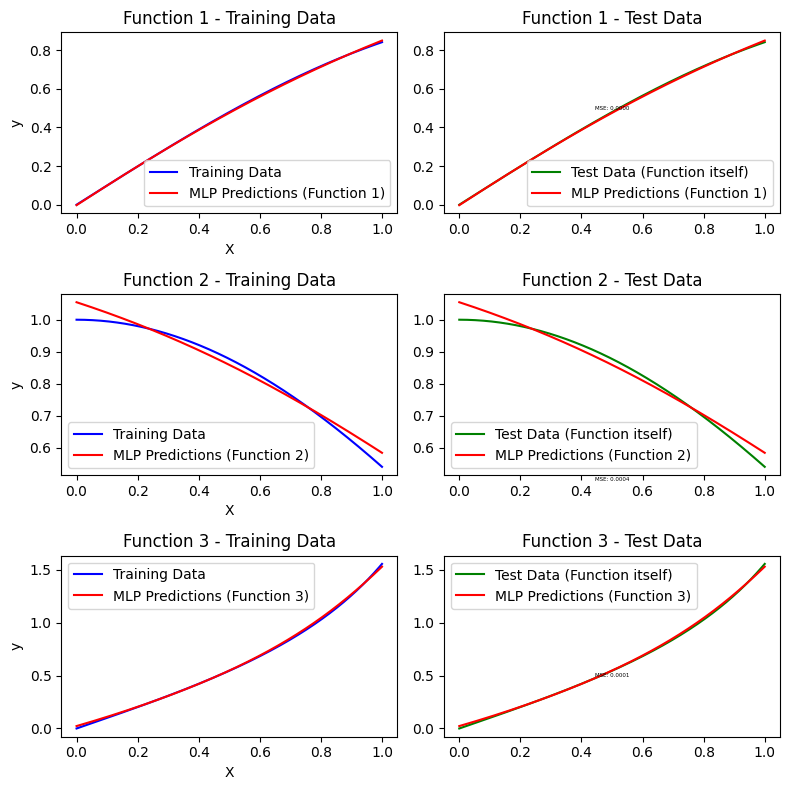

In [ ]:
# Set up subplots
fig, axes = plt.subplots(3, 2, figsize=(8,8))

# Loop through each function
for i, y_train in enumerate([y_train1, y_train2, y_train3]):
    # y_train = np.nan_to_num(y_train)  # Replace NaN with zero and infinity with large finite numbers
    y_train = y_train.ravel()
    # Train the MLP on the training data
    mlp.fit(X_train, y_train)

    # Predictions on the wider range
    y_pred = mlp.predict(X_plot)

    # Predictions on the test data (use the function itself)
    y_test = y_train

    # Calculate the error rate (MSE) for the test set
    mse_test = ((y_test - mlp.predict(X_train)) ** 2).mean()

    # Plotting for training data
    axes[i, 0].plot(X_train, y_train, label='Training Data', color='blue')
    axes[i, 0].plot(X_plot, y_pred, label=f'MLP Predictions (Function {i + 1})', color='red')
    axes[i, 0].set_title(f'Function {i + 1} - Training Data')
    axes[i, 0].legend()

    # Plotting for test data
    axes[i, 1].plot(X_train, y_test, label='Test Data (Function itself)', color='green')
    axes[i, 1].plot(X_train, mlp.predict(X_train), label=f'MLP Predictions (Function {i + 1})', color='red')
    axes[i, 1].set_title(f'Function {i + 1} - Test Data')
    axes[i, 1].legend()

    # Display the error rate (MSE) for the test set
    axes[i, 1].text(0.5, 0.5, f'MSE: {mse_test:.4f}', fontsize=4, ha='center', va='center')

# Set common labels
for ax in axes[:, 0]:
    ax.set_xlabel('X')
    ax.set_ylabel('y')

plt.tight_layout()
plt.show()


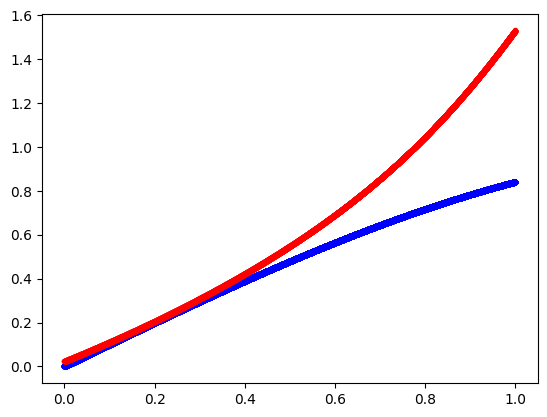

In [ ]:
fig, ax = plt.subplots()

ax.plot(X_train, y_train1, 'b', label='Actual', marker=".", linestyle="None")

ax.plot(X_plot,  mlp.predict(X_plot), 'r', label='Predicted', marker=".", linestyle="None")



# PART 2.1


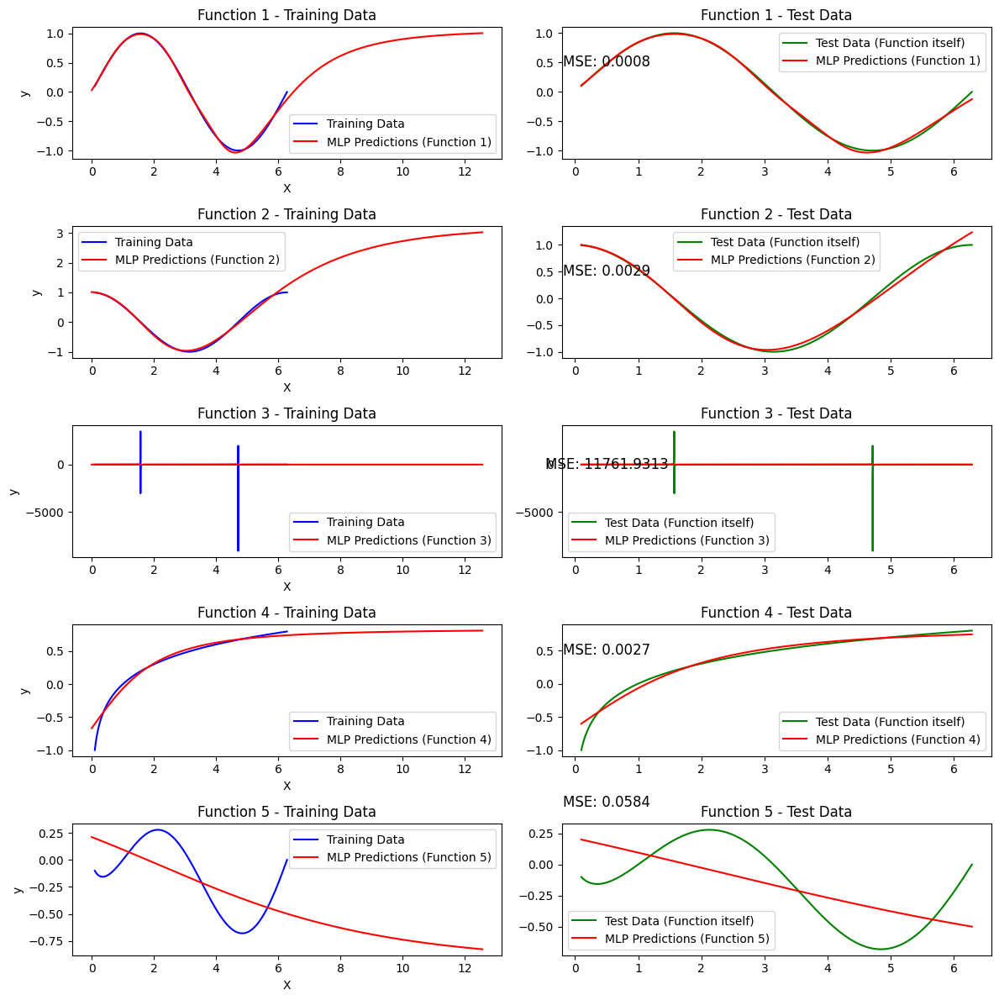

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor

# Generate training data from different functions
#avoide zero for log10 (0.1)
X_train = np.linspace(0.1, 2 * np.pi, 10000)  # Training data
# print(X_train)
y_train1 = np.sin(X_train)
y_train2 = np.cos(X_train)
y_train3 = np.tan(X_train)
y_train4 = np.log10(X_train)
y_train5 = np.sin(X_train) * np.log10(X_train)
y_train4[np.isinf(y_train4)] = 0  # Replace inf with a suitable value
y_train5[np.isinf(y_train4)] = 0  # Replace inf with a suitable value


# Create an MLP regressor
mlp = MLPRegressor(hidden_layer_sizes=(20, 20,), activation='logistic', solver='adam', max_iter=1000, random_state=0)

# Reshape X_train for training
X_train = X_train.reshape(-1, 1)

# Wider range of input values for plotting
# test data
X_plot = np.linspace(0, 4 * np.pi, 1000).reshape(-1, 1)

# Set up subplots
fig, axes = plt.subplots(5, 2, figsize=(12, 12))

# Loop through each function
for i, y_train in enumerate([y_train1, y_train2, y_train3, y_train4, y_train5]):
    # Train the MLP on the training data
    mlp.fit(X_train, y_train)

    # Predictions on the wider range
    y_pred = mlp.predict(X_plot)

    # Predictions on the test data (use the function itself)
    y_test = y_train

    # Calculate the error rate (MSE) for the test set
    mse_test = ((y_test - mlp.predict(X_train)) ** 2).mean()

    # Plotting for training data
    axes[i, 0].plot(X_train, y_train, label='Training Data', color='blue')
    axes[i, 0].plot(X_plot, y_pred, label=f'MLP Predictions (Function {i + 1})', color='red')
    axes[i, 0].set_title(f'Function {i + 1} - Training Data')
    axes[i, 0].legend()

    # Plotting for test data
    axes[i, 1].plot(X_train, y_test, label='Test Data (Function itself)', color='green')
    axes[i, 1].plot(X_train, mlp.predict(X_train), label=f'MLP Predictions (Function {i + 1})', color='red')
    axes[i, 1].set_title(f'Function {i + 1} - Test Data')
    axes[i, 1].legend()

    # Display the error rate (MSE) for the test set
    axes[i, 1].text(0.5, 0.5, f'MSE: {mse_test:.4f}', fontsize=12, ha='center', va='center')

# Set common labels
for ax in axes[:, 0]:
    ax.set_xlabel('X')
    ax.set_ylabel('y')

plt.tight_layout()
plt.show()


# PART 3



<ipython-input-6-4a62284fcc07>:14: RuntimeWarning: invalid value encountered in log10
  functions = [np.sin, np.cos, np.tan, lambda x: np.log10(x + 1e-10), lambda x: np.sin(x) * np.log10(x + 1e-10)]


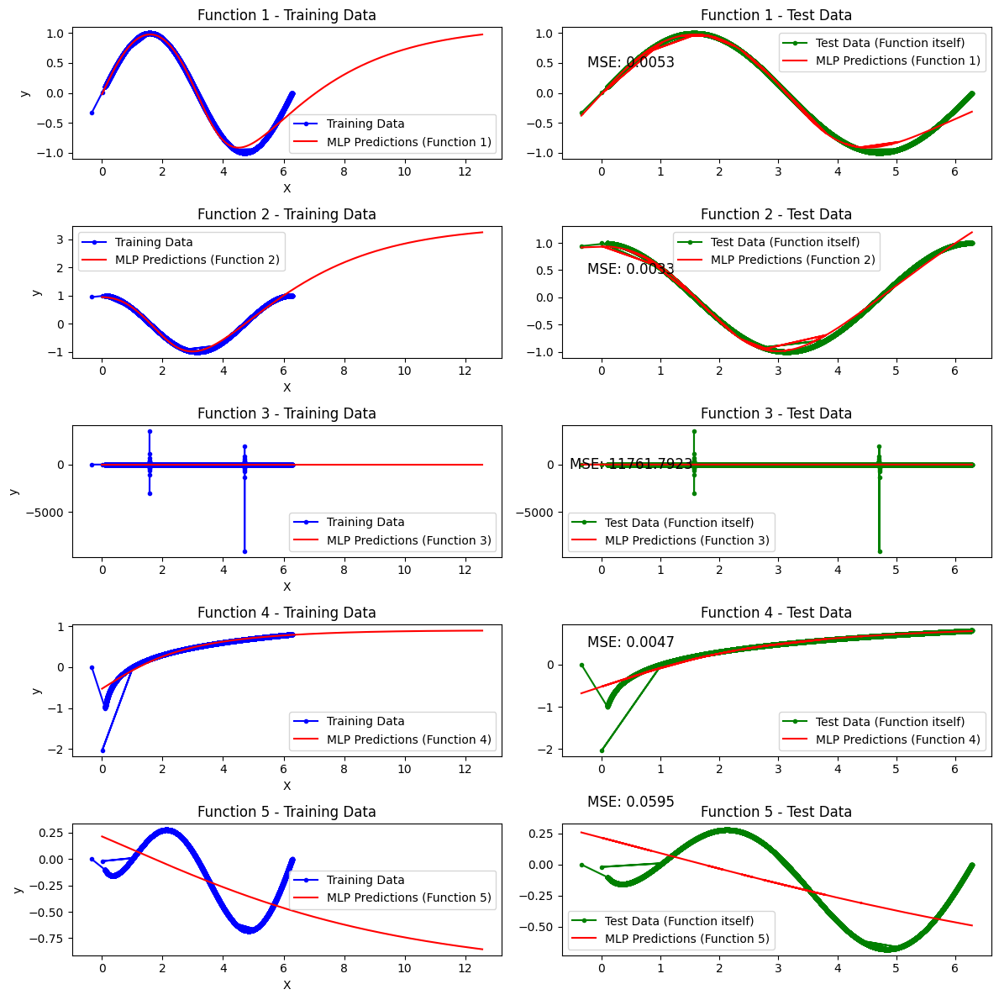

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor

# Generate training data from different functions
X_train = np.linspace(0.1, 2 * np.pi, 10000)  # Training data

# Add random numbers to inputs once every 500 numbers
random_addition = 0.5

for i in range(0, len(X_train), 500):
    X_train[i] += random_addition * np.random.randn()

functions = [np.sin, np.cos, np.tan, lambda x: np.log10(x + 1e-10), lambda x: np.sin(x) * np.log10(x + 1e-10)]


# Initialize arrays to store noisy training data for each function
y_train_noisy = [f(X_train) for f in functions]

# Create an MLP regressor
mlp = MLPRegressor(hidden_layer_sizes=(20), activation='logistic', solver='adam', max_iter=1000, random_state=0)

# Wider range of input values for plotting
X_plot = np.linspace(0, 4 * np.pi, 1000).reshape(-1, 1)

# Set up subplots
fig, axes = plt.subplots(5, 2, figsize=(12, 12))

# Loop through each function
for i, y_train_noisy in enumerate(y_train_noisy):
    # Replace NaN or infinite values with a default value (e.g., 0)
    y_train_noisy[np.isnan(y_train_noisy) | np.isinf(y_train_noisy)] = 0

    # Train the MLP on the training data
    mlp.fit(X_train.reshape(-1, 1), y_train_noisy)

    # Predictions on the wider range
    y_pred = mlp.predict(X_plot)

    # Predictions on the test data (use the function itself)
    y_test = y_train_noisy

    # Calculate the error rate (MSE) for the test set
    mse_test = ((y_test - mlp.predict(X_train.reshape(-1, 1))) ** 2).mean()

    # Plotting for training data
    axes[i, 0].plot(X_train, y_train_noisy, label='Training Data', marker = '.',color='blue')
    axes[i, 0].plot(X_plot, y_pred, label=f'MLP Predictions (Function {i + 1})', color='red')
    axes[i, 0].set_title(f'Function {i + 1} - Training Data')
    axes[i, 0].legend()

    # Plotting for test data
    axes[i, 1].plot(X_train, y_test, label='Test Data (Function itself)', marker = '.', color='green')
    axes[i, 1].plot(X_train, mlp.predict(X_train.reshape(-1, 1)), label=f'MLP Predictions (Function {i + 1})', color='red')
    axes[i, 1].set_title(f'Function {i + 1} - Test Data')
    axes[i, 1].legend()

    # Display the error rate (MSE) for the test set
    axes[i, 1].text(0.5, 0.5, f'MSE: {mse_test:.4f}', fontsize=12, ha='center', va='center')

# Set common labels
for ax in axes[:, 0]:
    ax.set_xlabel('X')
    ax.set_ylabel('y')

plt.tight_layout()
plt.show()


# PART 4



In [7]:
# libraries

import cv2
from google.colab.patches import cv2_imshow as imshow
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder

In [8]:
# Load the image
pic1 = cv2.imread('/content/pic3.jpg')

# Convert the image to grayscale
pic1_gray = cv2.cvtColor(pic1, cv2.COLOR_BGR2GRAY)

# Apply edge detection (optional)
pic1_edges = cv2.Canny(pic1_gray, 50, 150)

# Find contours in the edged image
contours, _ = cv2.findContours(pic1_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


In [9]:
# Iterate through contours and print coordinates

# for contour in contours:
#     for point in contour:
#         x, y = point[0]
#         print(f"X: {x}, Y: {y}")

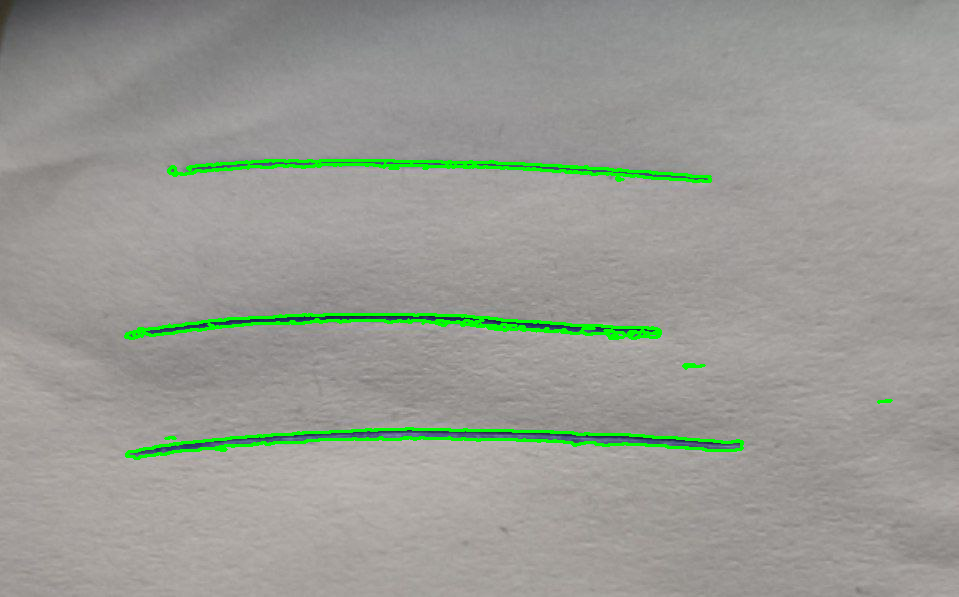

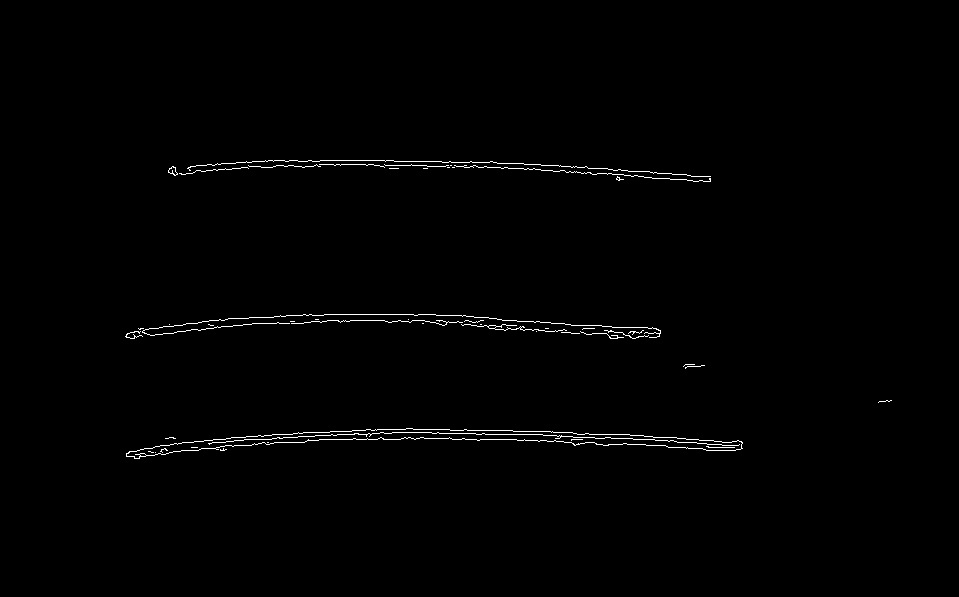

In [10]:
# Display the image with the contours (optional)
cv2.drawContours(pic1, contours, -1, (0, 255, 0), 2)
imshow(pic1)
imshow(pic1_edges)
cv2.waitKey(0)
cv2.destroyAllWindows()

Iteration 1

In [11]:
import cv2
import numpy as np

def detect_upper_lines(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply GaussianBlur to reduce noise and help edge detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Use the Canny edge detector
    edges = cv2.Canny(blurred, 50, 150)

    # Find lines using the HoughLinesP transform
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=25, minLineLength=25, maxLineGap=15)

    # Find contours in the edged image
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Extract coordinates of the upper line
    upper_line = None
    for line in lines:
        x1, y1, x2, y2 = line[0]
        # Consider only lines near the top edge of the image
        if y1 < image.shape[0] // 2 and y2 < image.shape[0] // 2:
            upper_line = line
            break

    if upper_line is not None:
        x1, y1, x2, y2 = upper_line[0]
        print(f"Upper line coordinates: ({x1}, {y1}) - ({x2}, {y2})")
    else:
        print("Upper line not found")

    # Display the image with the detected line
    cv2.drawContours(image, contours, -1, (0, 255, 0), 2)
    imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()




Upper line coordinates: (1017, 250) - (1138, 196)


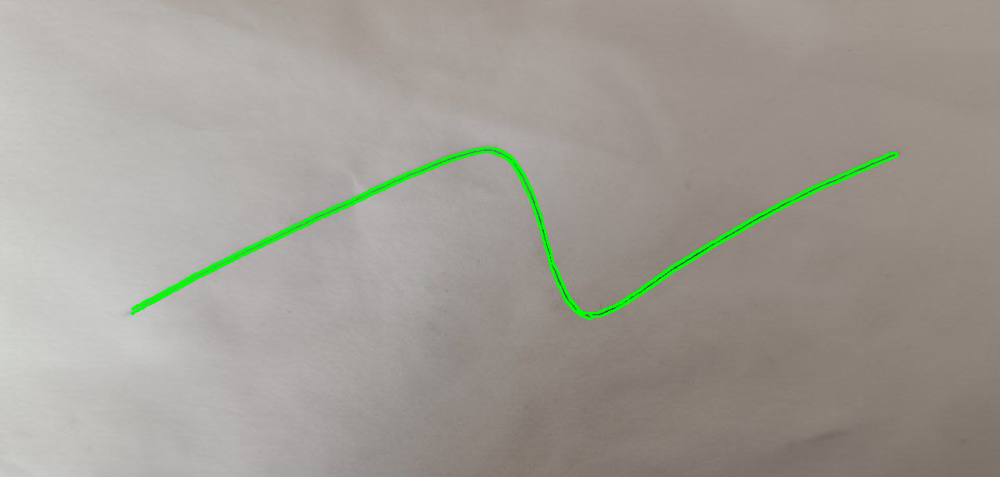

Upper line coordinates: (661, 414) - (682, 453)


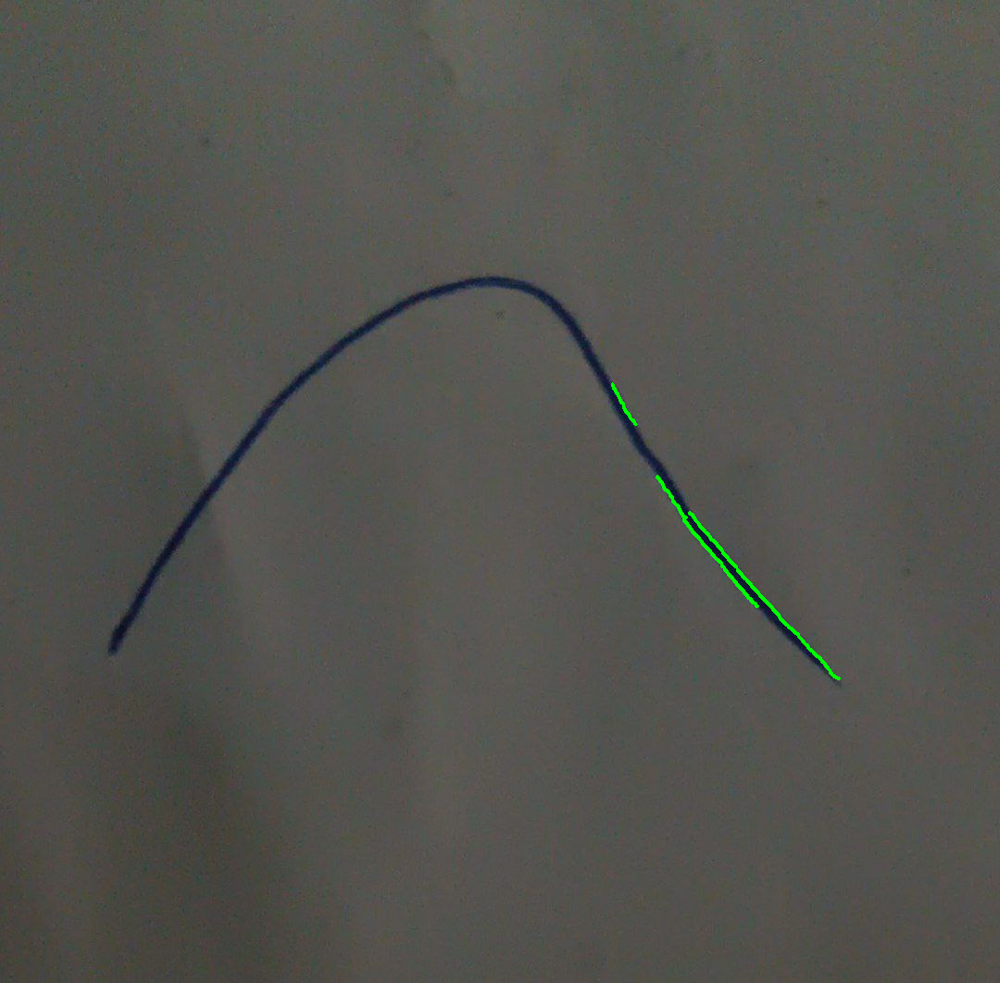

Upper line coordinates: (338, 160) - (524, 163)


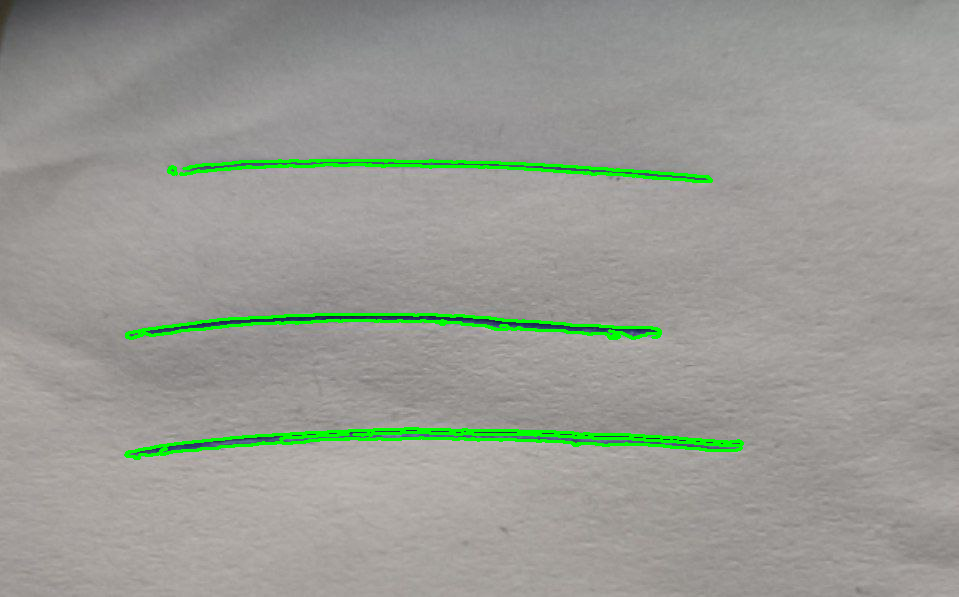

Upper line coordinates: (61, 62) - (153, 61)


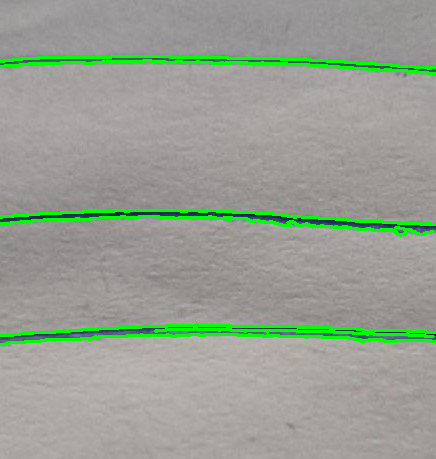

In [12]:
detect_upper_lines('/content/pic1.jpg')
detect_upper_lines('/content/pic2.jpg')
detect_upper_lines('/content/pic3.jpg')
detect_upper_lines('/content/pic4.jpg')

Iteration 2


In [13]:
import cv2
import numpy as np

def detect_upper_line(image_path):
    # Read the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply GaussianBlur to reduce noise and help edge detection
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Use the Canny edge detector
    edges = cv2.Canny(blurred, 50, 150)

    # Find lines using the HoughLinesP transform
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=40, minLineLength=60, maxLineGap=20)

    # Extract coordinates of the upper line
    upper_line_points = []
    for line in lines:
        x1, y1, x2, y2 = line[0]
        # Consider only lines near the top edge of the image
        if y1 < image.shape[0] // 2 and y2 < image.shape[0] // 2:
            upper_line_points.extend([(x, y) for x, y in zip(np.linspace(x1, x2, num=100), np.linspace(y1, y2, num=100))])

    return_upper_line_points = list()

    if upper_line_points:
        # uniquize coordinates
        tmp = list()
        for point in upper_line_points:
            if not point[0] in tmp:
                tmp.append(point[0])
                return_upper_line_points.append(point)


        # Convert the list of points to a NumPy array
        upper_line_points = np.array(upper_line_points, dtype=np.int32)

        # Reshape the array to have the required format for drawContours
        upper_line_points = upper_line_points.reshape((-1, 1, 2))

        # Create an empty image to draw the contours
        contour_image = np.zeros_like(image)

        # Draw the contours on the empty image
        cv2.drawContours(contour_image, [upper_line_points], -1, (0, 255, 0), 2)

        # Display the image with the detected line
        imshow(contour_image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()
    else:
        print("Upper line not found")

    if return_upper_line_points:
        return return_upper_line_points


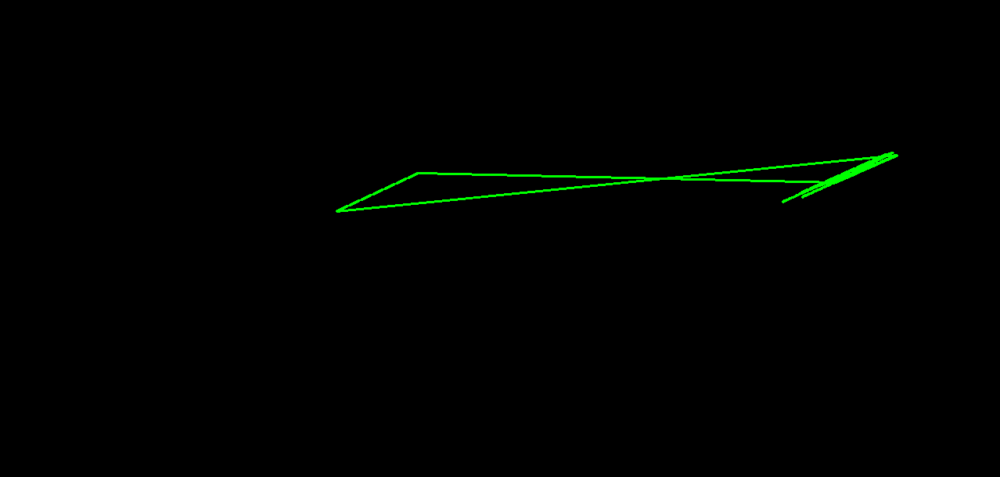

Upper line coordinates: (1017, 250) - (1138, 196)


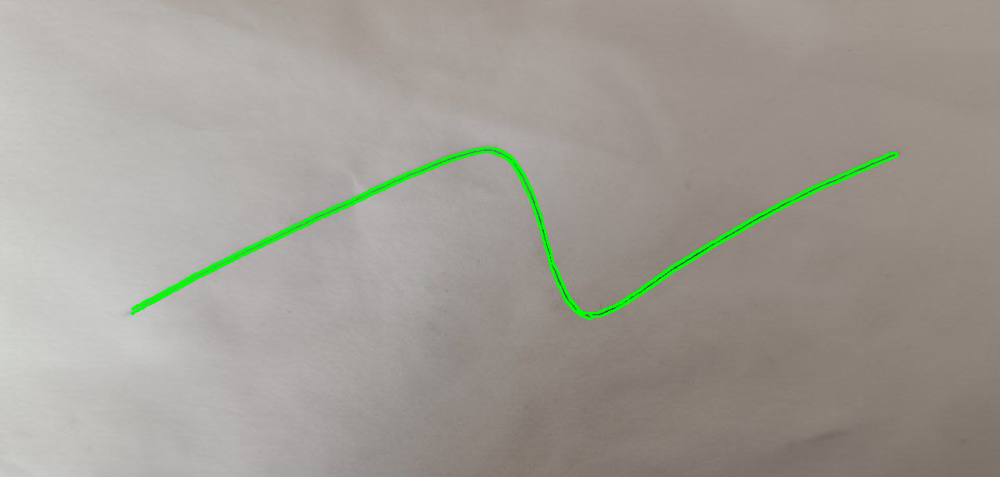

Upper line not found
Upper line coordinates: (661, 414) - (682, 453)


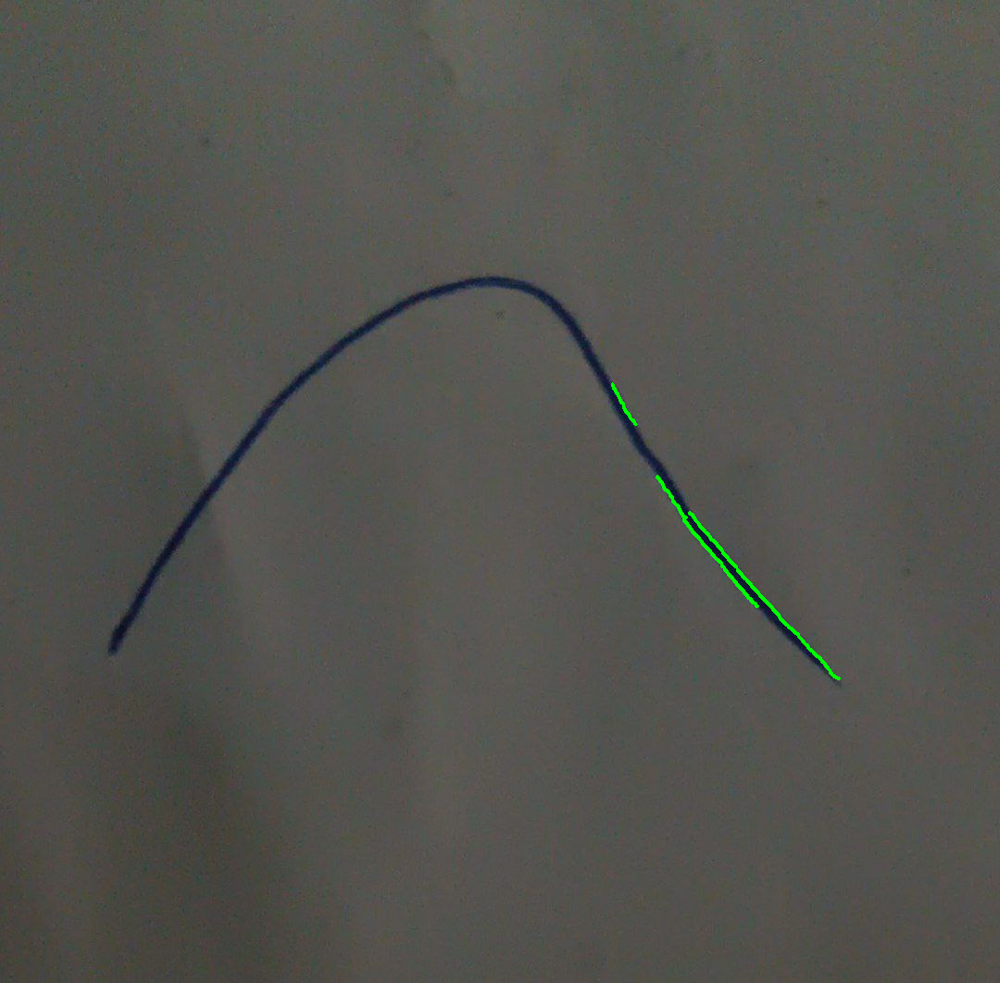

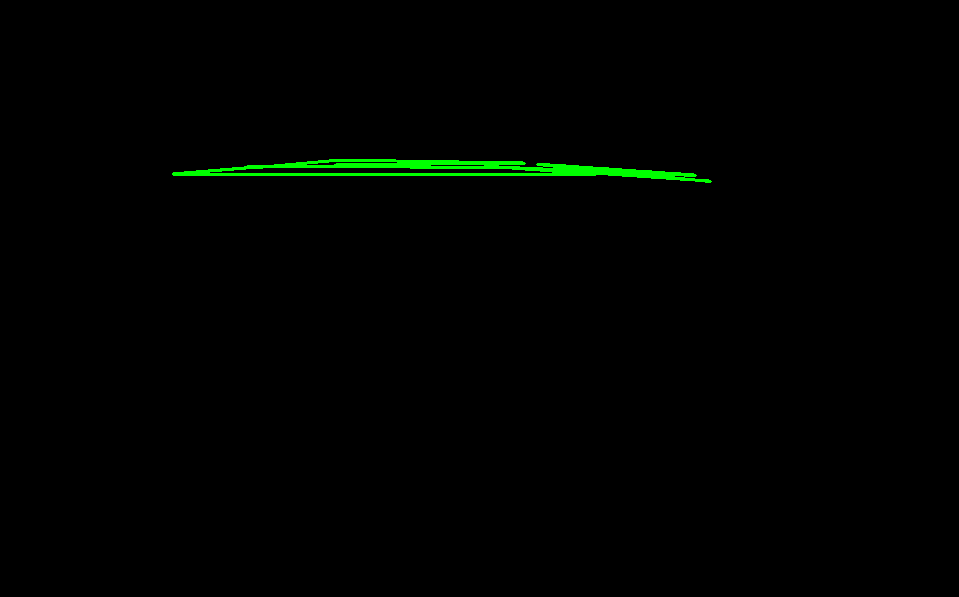

Upper line coordinates: (338, 160) - (524, 163)


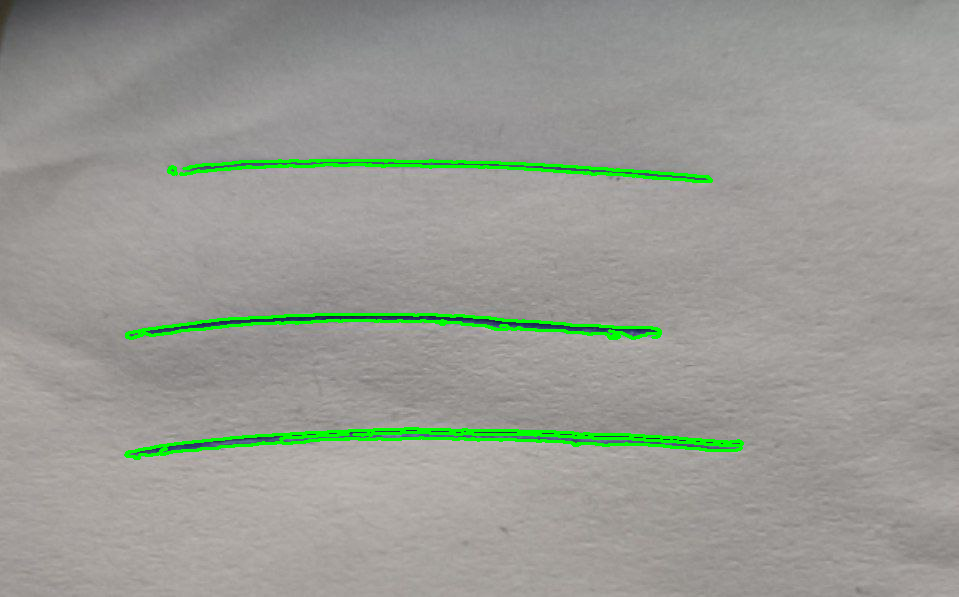

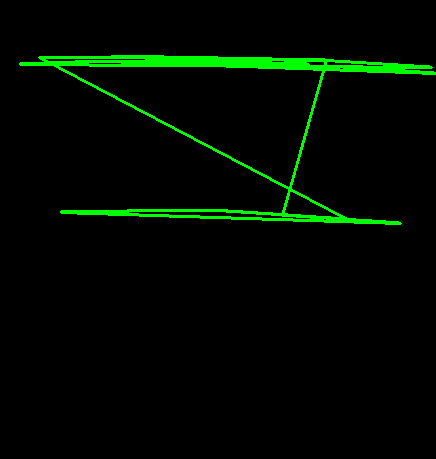

Upper line coordinates: (61, 62) - (153, 61)


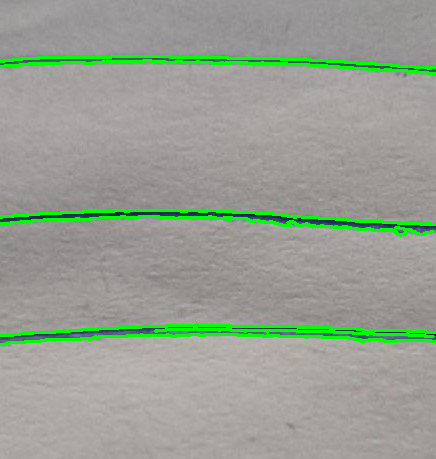

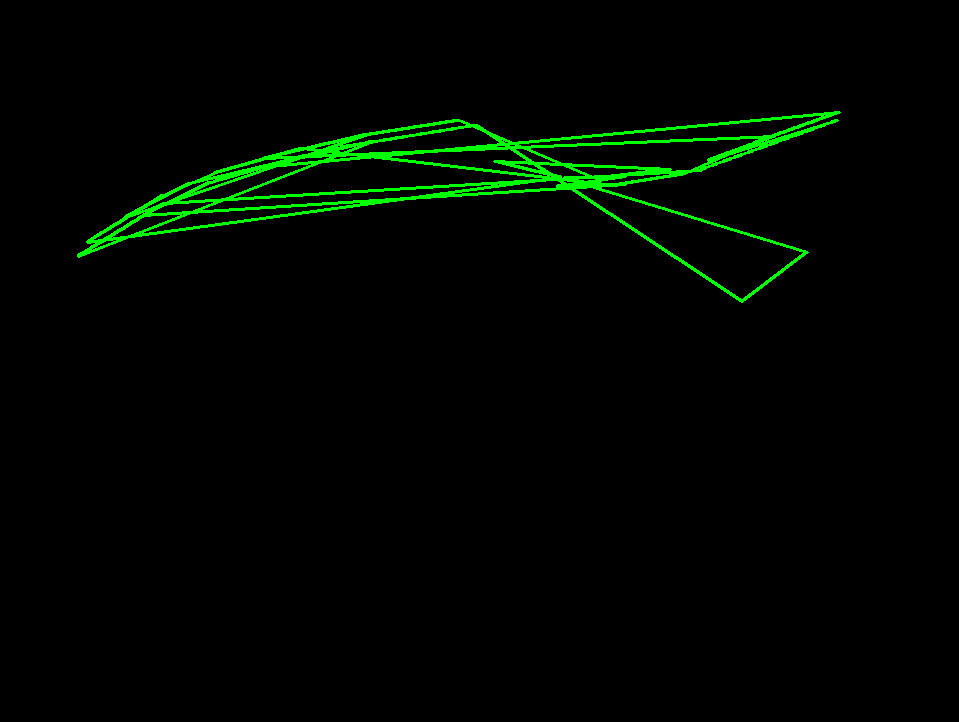

Upper line coordinates: (700, 162) - (839, 112)


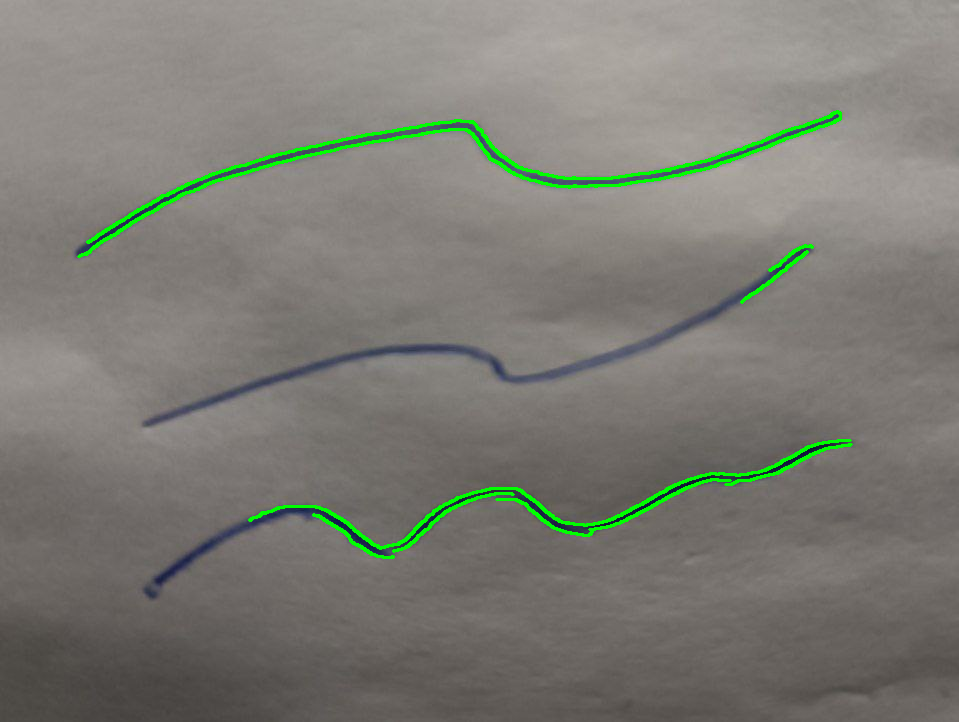

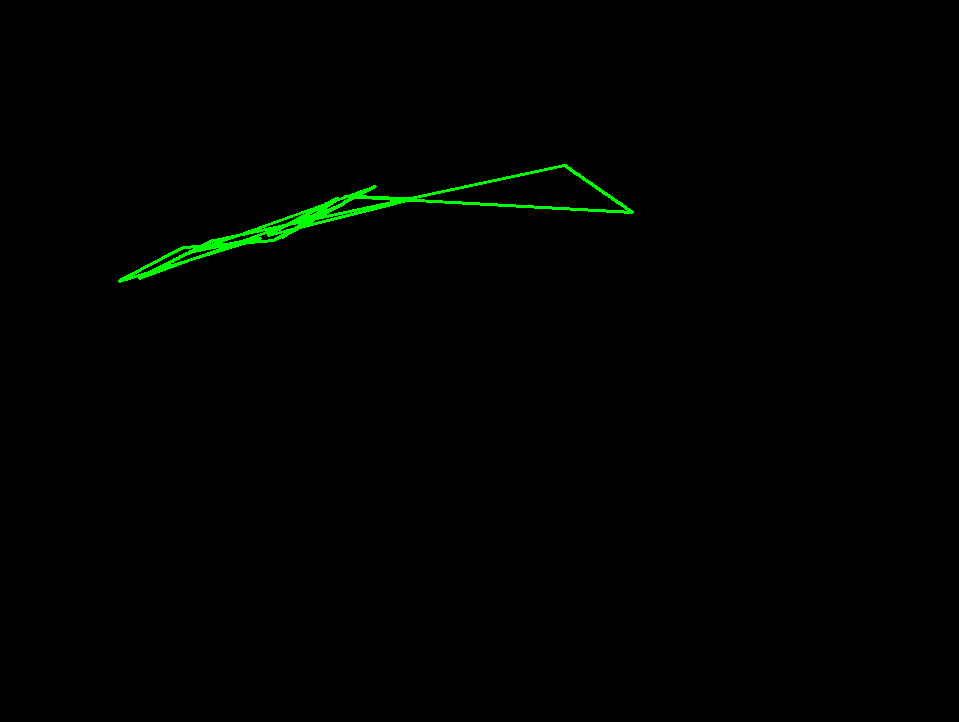

Upper line coordinates: (268, 235) - (338, 198)


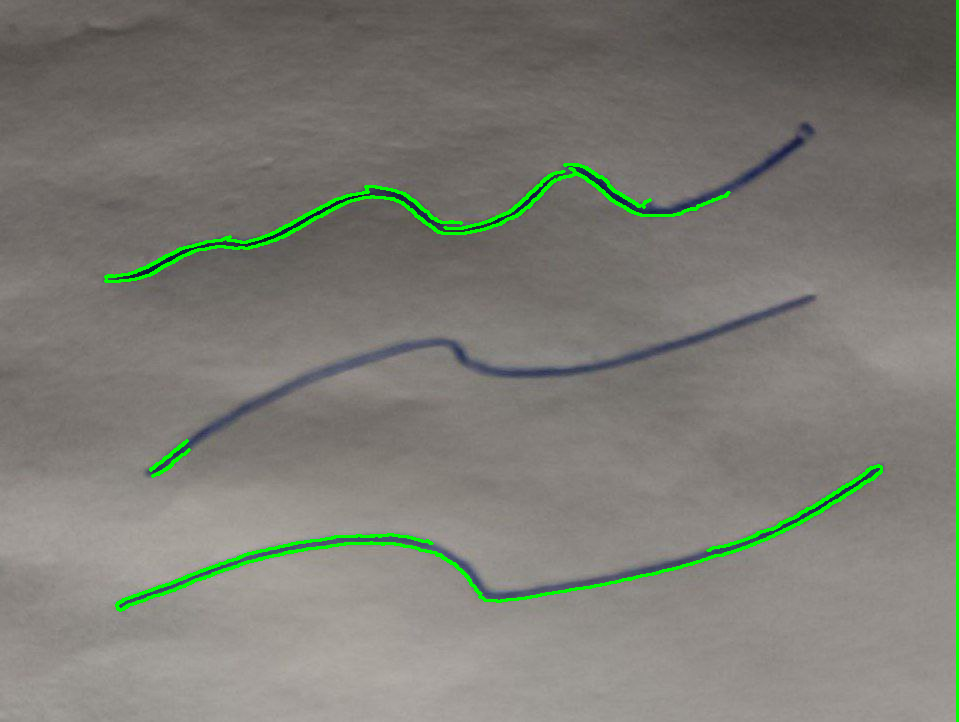

In [14]:
detect_upper_line('/content/pic1.jpg')
detect_upper_lines('/content/pic1.jpg')

detect_upper_line('/content/pic2.jpg')
detect_upper_lines('/content/pic2.jpg')

detect_upper_line('/content/pic3.jpg')
detect_upper_lines('/content/pic3.jpg')

detect_upper_line('/content/pic4.jpg')
detect_upper_lines('/content/pic4.jpg')

detect_upper_line('/content/pic5.jpg')
detect_upper_lines('/content/pic5.jpg')

detect_upper_line('/content/pic6.jpg')
detect_upper_lines('/content/pic6.jpg')


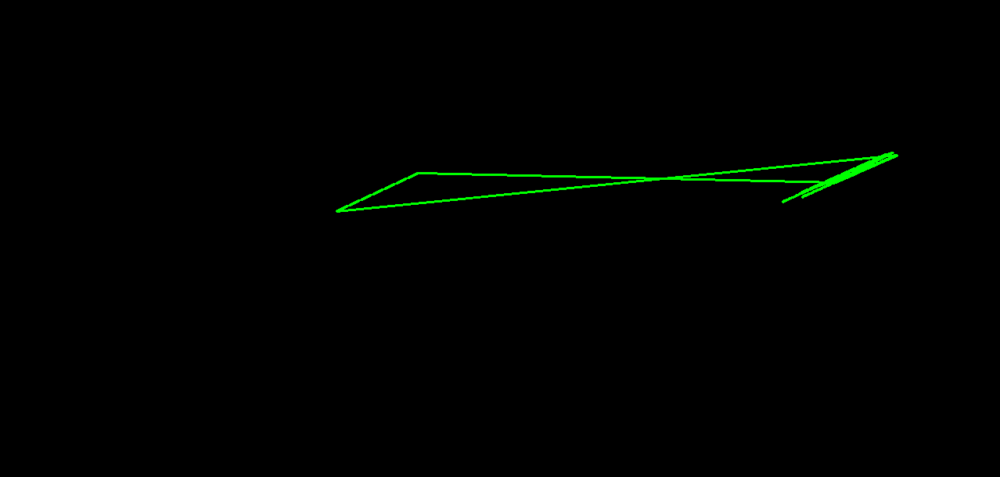

In [15]:
chart_coordinates = detect_upper_line('/content/pic1.jpg')
chart_coordinates = np.array(chart_coordinates)



In [35]:
x = np.array([chart_coordinate[0] for chart_coordinate in chart_coordinates]).reshape(-1, 1)
y = np.array([chart_coordinate[1] for chart_coordinate in chart_coordinates]).reshape(-1, 1)

# Impute missing values
imputer = SimpleImputer(strategy='constant')
x_imputed = imputer.fit_transform(x)

# Split dataset into training set and test set
x_train, x_test, y_train, y_test = train_test_split(x_imputed, y, test_size=0.25)  # 75% training and 25% test


In [36]:
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.fit_transform(y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [37]:
clf = MLPClassifier(hidden_layer_sizes=(100, 20),
                    random_state=5,
                    activation='logistic', # otherwise:  identity, logistic, tanh, relu, activation
                    verbose=True,
                    learning_rate_init=0.01)

print(clf)
print(type(clf))

MLPClassifier(activation='logistic', hidden_layer_sizes=(100, 20),
              learning_rate_init=0.01, random_state=5, verbose=True)
<class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>


In [38]:
# Fit data onto the model
clf.fit(x_train, y_train)

Iteration 1, loss = 5.88363405
Iteration 2, loss = 5.83709676
Iteration 3, loss = 5.82701271
Iteration 4, loss = 5.82412723
Iteration 5, loss = 5.82308745
Iteration 6, loss = 5.82226367
Iteration 7, loss = 5.82172538
Iteration 8, loss = 5.82098336
Iteration 9, loss = 5.82028902
Iteration 10, loss = 5.81920546
Iteration 11, loss = 5.81829663
Iteration 12, loss = 5.81703407
Iteration 13, loss = 5.81566536
Iteration 14, loss = 5.81584534
Iteration 15, loss = 5.81588594
Iteration 16, loss = 5.81577581
Iteration 17, loss = 5.81510390
Iteration 18, loss = 5.81446266
Iteration 19, loss = 5.81459224
Iteration 20, loss = 5.81393918
Iteration 21, loss = 5.81479490
Iteration 22, loss = 5.81434921
Iteration 23, loss = 5.81408317
Iteration 24, loss = 5.81411079
Iteration 25, loss = 5.81374863
Iteration 26, loss = 5.81374158
Iteration 27, loss = 5.81390626
Iteration 28, loss = 5.81507062
Iteration 29, loss = 5.81418622
Iteration 30, loss = 5.81439566
Iteration 31, loss = 5.81365533
Iteration 32, los

MLPClassifier(activation='logistic', hidden_layer_sizes=(100, 20),
              learning_rate_init=0.01, random_state=5, verbose=True)

In [39]:
# Make prediction on test dataset
ypred = clf.predict(x_test)

# Calcuate accuracy
accuracy_score(y_test,ypred)

0.0

# PART 4.1

In [140]:
import matplotlib.pyplot as plt
import cv2
from random import random, randint
from google.colab.patches import cv2_imshow as imshow
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
import matplotlib
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [141]:
i_range, j_range = 100, 500


i = [randint(0, i_range) for i in range(50000)]

j = [randint(0, j_range) for i in range(50000)]

In [142]:
z = [Z for Z in zip(i, j)]

z

[(69, 164),
 (92, 433),
 (6, 299),
 (44, 271),
 (49, 118),
 (65, 64),
 (4, 128),
 (72, 160),
 (15, 438),
 (93, 379),
 (86, 257),
 (59, 361),
 (68, 7),
 (21, 105),
 (37, 214),
 (10, 148),
 (19, 174),
 (60, 199),
 (23, 454),
 (81, 416),
 (100, 164),
 (62, 115),
 (35, 341),
 (46, 312),
 (82, 448),
 (98, 225),
 (77, 470),
 (72, 116),
 (27, 34),
 (86, 45),
 (71, 230),
 (49, 387),
 (92, 419),
 (72, 276),
 (96, 279),
 (74, 172),
 (59, 264),
 (9, 266),
 (54, 460),
 (97, 283),
 (44, 215),
 (99, 497),
 (16, 218),
 (4, 458),
 (35, 51),
 (27, 135),
 (33, 275),
 (32, 325),
 (53, 98),
 (64, 247),
 (24, 429),
 (49, 456),
 (75, 91),
 (60, 72),
 (10, 324),
 (59, 34),
 (13, 196),
 (10, 299),
 (52, 21),
 (6, 63),
 (97, 201),
 (62, 281),
 (66, 500),
 (73, 358),
 (99, 451),
 (13, 0),
 (87, 232),
 (86, 204),
 (20, 368),
 (34, 379),
 (47, 220),
 (14, 442),
 (13, 151),
 (89, 286),
 (97, 14),
 (15, 252),
 (0, 229),
 (81, 65),
 (43, 131),
 (91, 477),
 (82, 419),
 (49, 492),
 (67, 3),
 (30, 254),
 (19, 25),
 (86

In [143]:
sorted_z = sorted(z, key=lambda x: x[1], reverse=True)

sorted_z

[(66, 500),
 (11, 500),
 (97, 500),
 (58, 500),
 (36, 500),
 (37, 500),
 (25, 500),
 (74, 500),
 (87, 500),
 (68, 500),
 (80, 500),
 (35, 500),
 (51, 500),
 (41, 500),
 (25, 500),
 (8, 500),
 (67, 500),
 (78, 500),
 (38, 500),
 (78, 500),
 (5, 500),
 (49, 500),
 (36, 500),
 (31, 500),
 (86, 500),
 (55, 500),
 (92, 500),
 (94, 500),
 (17, 500),
 (17, 500),
 (33, 500),
 (63, 500),
 (45, 500),
 (24, 500),
 (18, 500),
 (16, 500),
 (34, 500),
 (50, 500),
 (60, 500),
 (67, 500),
 (99, 500),
 (84, 500),
 (30, 500),
 (6, 500),
 (21, 500),
 (79, 500),
 (40, 500),
 (36, 500),
 (66, 500),
 (27, 500),
 (35, 500),
 (34, 500),
 (29, 500),
 (57, 500),
 (88, 500),
 (10, 500),
 (60, 500),
 (25, 500),
 (47, 500),
 (58, 500),
 (37, 500),
 (63, 500),
 (79, 500),
 (76, 500),
 (74, 500),
 (58, 500),
 (80, 500),
 (72, 500),
 (53, 500),
 (24, 500),
 (12, 500),
 (95, 500),
 (74, 500),
 (64, 500),
 (45, 500),
 (23, 500),
 (23, 500),
 (44, 500),
 (67, 500),
 (100, 500),
 (76, 500),
 (24, 500),
 (97, 500),
 (56, 

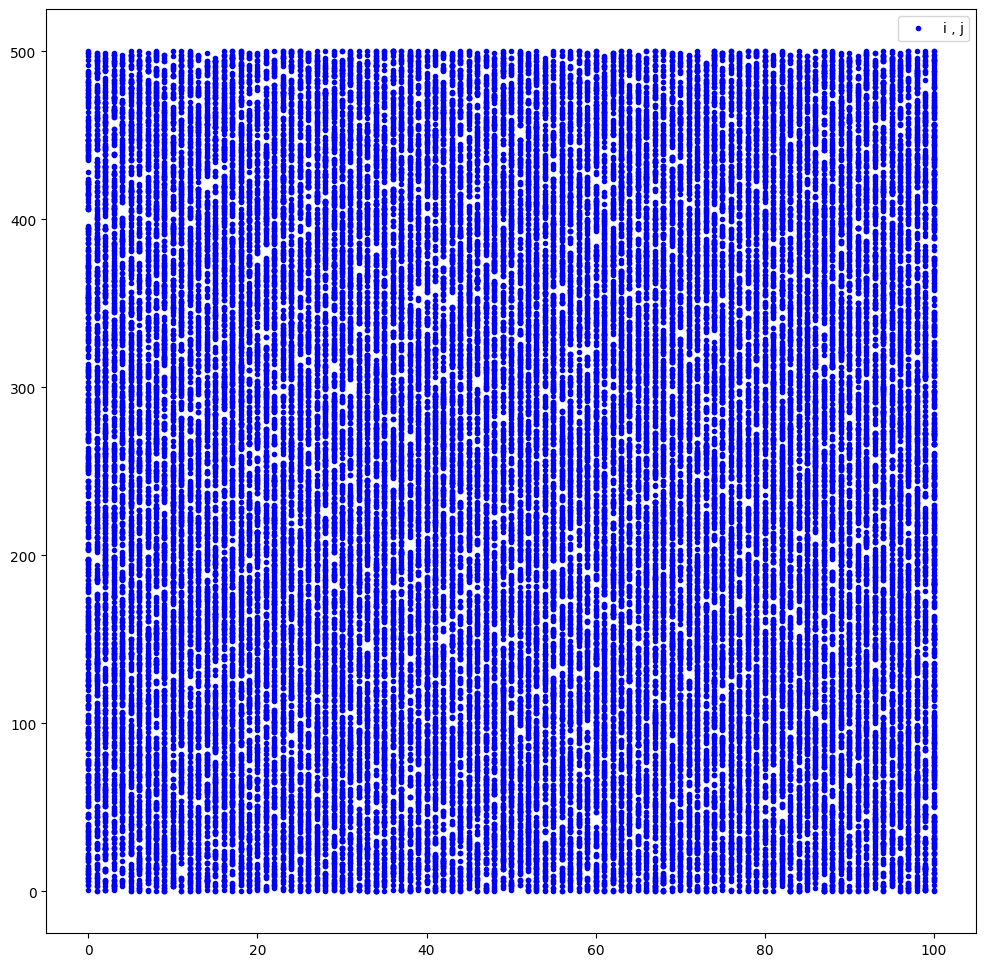

In [144]:
fig, axes = plt.subplots(1, 1, figsize=(12, 12))

# Plotting for training data
axes.plot(i, j, label='i , j', marker = '.',linestyle="None", color='blue')
axes.legend()

In [145]:
temp = set()
upper_points = []

for point in sorted_z:
  if not point[0] in temp:
    temp.add(point[0])
    upper_points.append(point)

sorted_upper_points =  sorted(upper_points, key=lambda x: x[0])

sorted_upper_points

[(0, 500),
 (1, 499),
 (2, 499),
 (3, 499),
 (4, 498),
 (5, 500),
 (6, 500),
 (7, 499),
 (8, 500),
 (9, 498),
 (10, 500),
 (11, 500),
 (12, 500),
 (13, 498),
 (14, 499),
 (15, 496),
 (16, 500),
 (17, 500),
 (18, 500),
 (19, 499),
 (20, 499),
 (21, 500),
 (22, 500),
 (23, 500),
 (24, 500),
 (25, 500),
 (26, 499),
 (27, 500),
 (28, 500),
 (29, 500),
 (30, 500),
 (31, 500),
 (32, 500),
 (33, 500),
 (34, 500),
 (35, 500),
 (36, 500),
 (37, 500),
 (38, 500),
 (39, 500),
 (40, 500),
 (41, 500),
 (42, 499),
 (43, 499),
 (44, 500),
 (45, 500),
 (46, 499),
 (47, 500),
 (48, 499),
 (49, 500),
 (50, 500),
 (51, 500),
 (52, 499),
 (53, 500),
 (54, 496),
 (55, 500),
 (56, 500),
 (57, 500),
 (58, 500),
 (59, 499),
 (60, 500),
 (61, 497),
 (62, 499),
 (63, 500),
 (64, 500),
 (65, 498),
 (66, 500),
 (67, 500),
 (68, 500),
 (69, 499),
 (70, 499),
 (71, 498),
 (72, 500),
 (73, 493),
 (74, 500),
 (75, 499),
 (76, 500),
 (77, 499),
 (78, 500),
 (79, 500),
 (80, 500),
 (81, 498),
 (82, 500),
 (83, 498),
 (

In [146]:
upper_i, upper_j = zip(*sorted_upper_points)

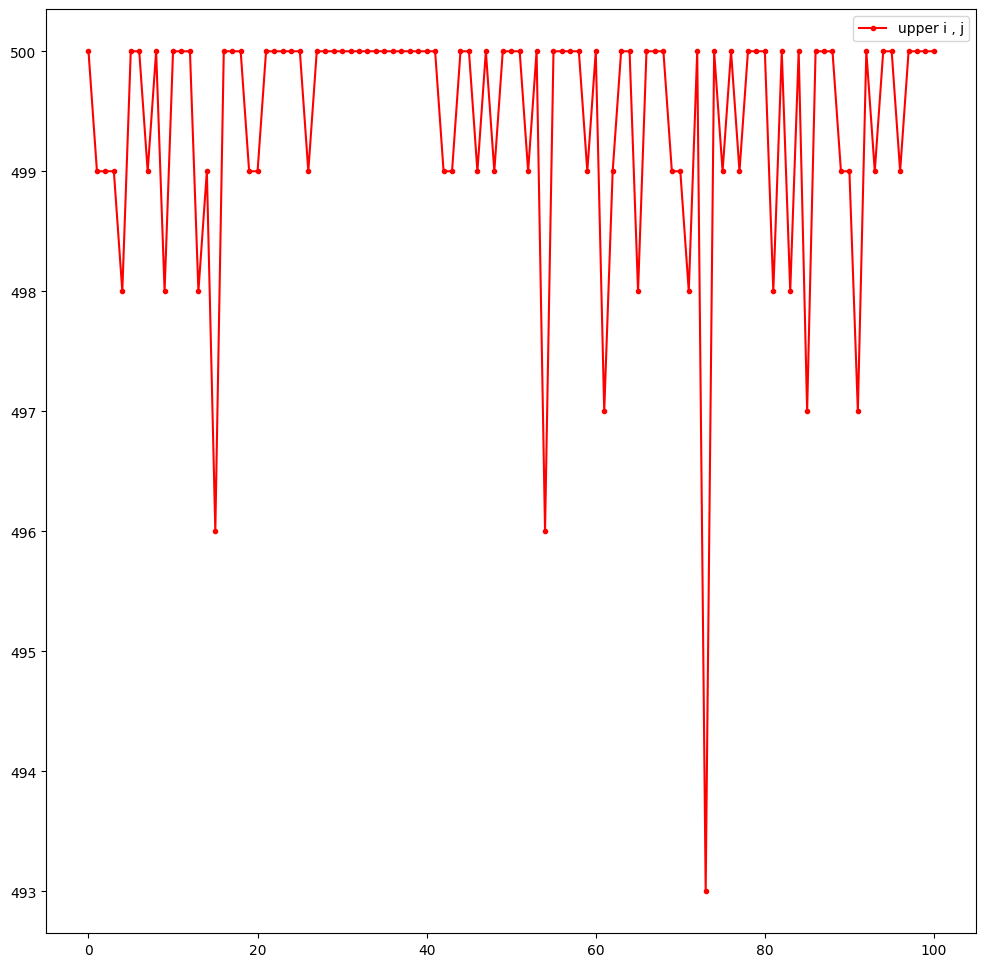

In [147]:
fig, axes = plt.subplots(1, 1, figsize=(12, 12))

# Plotting for training data
axes.plot(upper_i, upper_j ,label='upper i , j', marker = '.',color='red')
axes.legend()

In [148]:
upper_i = np.array(upper_i).reshape(-1, 1)
upper_j = np.array(upper_j).reshape(-1, 1)

In [149]:
# Split dataset into training set and test set
x_train, x_test, y_train, y_test = train_test_split(upper_i, upper_j, test_size=0.25)  # 75% training and 25% test


In [150]:
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.fit_transform(y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [151]:
# Create an MLP regressor
mlp = MLPRegressor(hidden_layer_sizes=(128, 128, 64),
                   activation='logistic',
                   solver='adam',
                   max_iter=1000,
                   random_state=27)


In [152]:
# y_train = np.nan_to_num(y_train)  # Replace NaN with zero and infinity with large finite numbers
y_train = y_train.ravel()
# Train the MLP on the training data
mlp.fit(x_train, y_train)


MLPRegressor(activation='logistic', hidden_layer_sizes=(128, 128, 64),
             max_iter=1000, random_state=27)

In [153]:
# Make prediction on test dataset
ypred = mlp.predict(x_test)

# Calcuate accuracy
mse = mean_squared_error(y_test, ypred)

In [154]:
mse

4.781639213759127

# PART 5



SOURCE: "https://kapernikov.com/tutorial-image-classification-with-scikit-learn/"

In [34]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import os
import pprint
import joblib
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_val_score
pp = pprint.PrettyPrinter(indent=4)

In [36]:
def resize_all(src, pklname, include, width=150, height=None):

    height = height if height is not None else width

    data = dict()
    data['description'] = 'resized ({0}x{1})animal images in rgb'.format(int(width), int(height))
    data['label'] = []
    data['filename'] = []
    data['data'] = []

    pklname = f"{pklname}_{width}x{height}px.pkl"

    # read all images in PATH, resize and write to DESTINATION_PATH
    for subdir in os.listdir(src):
        if subdir in include:
            print(subdir)
            current_path = os.path.join(src, subdir)

            for file in os.listdir(current_path):
                if file[-3:] in {'jpg', 'png'}:
                    im = imread(os.path.join(current_path, file))
                    im = resize(im, (width, height)) #[:,:,::-1]
                    data['label'].append(subdir[:-4])
                    data['filename'].append(file)
                    data['data'].append(im)

        joblib.dump(data, pklname)

In [7]:
# modify to fit your system
data_path = fr'{os.getenv("HOME")}/../content/drive/MyDrive/AI/AnimalFace/Image'
os.listdir(data_path)

['CatHead',
 'DeerHead',
 'EagleHead',
 'CowHead',
 'DogHead',
 'HumanHead',
 'BearHead',
 'DuckHead',
 'ChickenHead',
 'ElephantHead',
 'PigeonHead',
 'PandaHead',
 'Natural',
 'MonkeyHead',
 'LionHead',
 'RabbitHead',
 'PigHead',
 'MouseHead',
 'TigerHead',
 'SheepHead',
 'WolfHead']

In [8]:
base_name = 'animal_faces'
width = 80

include = {'ChickenHead', 'BearHead', 'ElephantHead',
           'EagleHead', 'DeerHead', 'MonkeyHead', 'PandaHead'}

resize_all(src=data_path, pklname=base_name, width=width, include=include)


DeerHead
EagleHead
BearHead
ChickenHead
ElephantHead
PandaHead
MonkeyHead


In [9]:
from collections import Counter

data = joblib.load(f'{base_name}_{width}x{width}px.pkl')

print('number of samples: ', len(data['data']))
print('keys: ', list(data.keys()))
print('description: ', data['description'])
print('image shape: ', data['data'][0].shape)
print('labels:', np.unique(data['label']))

Counter(data['label'])

number of samples:  716
keys:  ['description', 'label', 'filename', 'data']
description:  resized (80x80)animal images in rgb
image shape:  (80, 80, 3)
labels: ['Bear' 'Chicken' 'Deer' 'Eagle' 'Elephant' 'Monkey' 'Panda']


Counter({'Deer': 101,
         'Eagle': 97,
         'Bear': 101,
         'Chicken': 100,
         'Elephant': 100,
         'Panda': 117,
         'Monkey': 100})

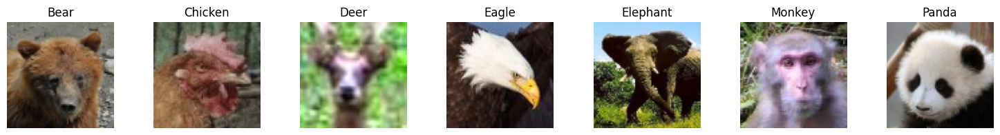

In [10]:
# use np.unique to get all unique values in the list of labels
labels = np.unique(data['label'])

# set up the matplotlib figure and axes, based on the number of labels
fig, axes = plt.subplots(1, len(labels))
fig.set_size_inches(15,4)
fig.tight_layout()

# make a plot for every label (equipment) type. The index method returns the
# index of the first item corresponding to its search string, label in this case
for ax, label in zip(axes, labels):
    idx = data['label'].index(label)

    ax.imshow(data['data'][idx])
    ax.axis('off')
    ax.set_title(label)

In [19]:
X = np.array(data['data'])
y = np.array(data['label'])

In [20]:
X = X.reshape(X.shape[0], -1)

In [37]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    shuffle=True,
    random_state=27,
)

In [38]:
# 1st try

model = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.7569444444444444


In [39]:
# 2nd try

model = MLPClassifier(hidden_layer_sizes=(128, 64, 16), max_iter=500)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.7708333333333334


In [40]:
# 3th try

model = MLPClassifier(hidden_layer_sizes=(15, 9, 6), max_iter=500)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.14583333333333334


In [41]:
# 4th try

model = MLPClassifier(hidden_layer_sizes=(256, 128, 64, 32, 16), max_iter=2000)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.7916666666666666


In [42]:
def plot_bar(y, loc='left', relative=True):
    width = 0.35
    if loc == 'left':
        n = -0.5
    elif loc == 'right':
        n = 0.5

    # calculate counts per type and sort, to ensure their order
    unique, counts = np.unique(y, return_counts=True)
    sorted_index = np.argsort(unique)
    unique = unique[sorted_index]

    if relative:
        # plot as a percentage
        counts = 100*counts[sorted_index]/len(y)
        ylabel_text = '% count'
    else:
        # plot counts
        counts = counts[sorted_index]
        ylabel_text = 'count'

    xtemp = np.arange(len(unique))

    plt.bar(xtemp + n*width, counts, align='center', alpha=.7, width=width)
    plt.xticks(xtemp, unique, rotation=45)
    plt.xlabel('equipment type')
    plt.ylabel(ylabel_text)



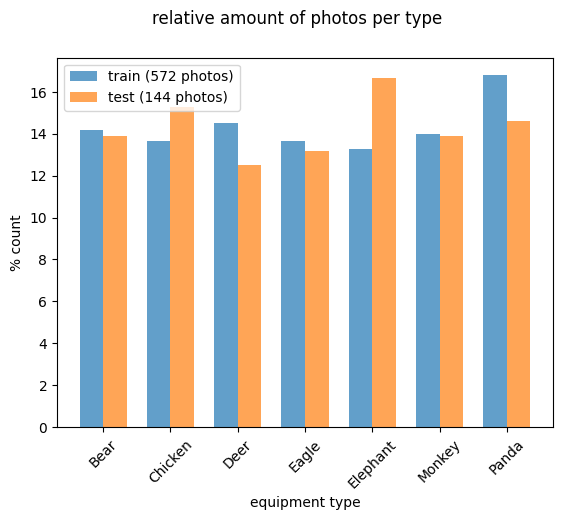

In [43]:
plt.suptitle('relative amount of photos per type')
plot_bar(y_train, loc='left')
plot_bar(y_test, loc='right')
plt.legend([
    'train ({0} photos)'.format(len(y_train)),
    'test ({0} photos)'.format(len(y_test))
]);

In [44]:
model = MLPClassifier(hidden_layer_sizes=(256, 128, 64, 32, 16), max_iter=2000)

# Perform 4-fold cross-validation
cv_scores = cross_val_score(model, X, y, cv=4)

print("Cross-Validation Scores:", cv_scores)
print("Mean Accuracy: {}%".format(np.mean(cv_scores) * 100))

Cross-Validation Scores: [0.73184358 0.76536313 0.79888268 0.73184358]
Mean Accuracy: 75.69832402234637%


# PART 6



In [72]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import os
import pprint
import joblib
from skimage.io import imread
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_val_score
from skimage import util
from random import randint
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler
from skimage.metrics import peak_signal_noise_ratio
pp = pprint.PrettyPrinter(indent=4)

In [46]:
def resize_all(src, pklname, include, width=150, height=None):

    height = height if height is not None else width

    data = dict()
    data['description'] = 'resized ({0}x{1})animal images in rgb'.format(int(width), int(height))
    data['label'] = []
    data['filename'] = []
    data['data'] = []

    pklname = f"{pklname}_{width}x{height}px.pkl"

    # read all images in PATH, resize and write to DESTINATION_PATH
    for subdir in os.listdir(src):
        if subdir in include:
            print(subdir)
            current_path = os.path.join(src, subdir)

            for file in os.listdir(current_path):
                if file[-3:] in {'jpg', 'png'}:
                    im = imread(os.path.join(current_path, file))
                    im = resize(im, (width, height)) #[:,:,::-1]
                    data['label'].append(subdir[:-4])
                    data['filename'].append(file)
                    data['data'].append(im)

        joblib.dump(data, pklname)

In [47]:
# modify to fit your system
data_path = fr'{os.getenv("HOME")}/../content/drive/MyDrive/AI/AnimalFace/Image'
os.listdir(data_path)

['CatHead',
 'DeerHead',
 'EagleHead',
 'CowHead',
 'DogHead',
 'HumanHead',
 'BearHead',
 'DuckHead',
 'ChickenHead',
 'ElephantHead',
 'PigeonHead',
 'PandaHead',
 'Natural',
 'MonkeyHead',
 'LionHead',
 'RabbitHead',
 'PigHead',
 'MouseHead',
 'TigerHead',
 'SheepHead',
 'WolfHead']

In [48]:
base_name = 'animal_faces'
width = 80

include = {'ChickenHead', 'BearHead', 'ElephantHead',
           'EagleHead', 'DeerHead', 'MonkeyHead', 'PandaHead'}

resize_all(src=data_path, pklname=base_name, width=width, include=include)


DeerHead
EagleHead
BearHead
ChickenHead
ElephantHead
PandaHead
MonkeyHead


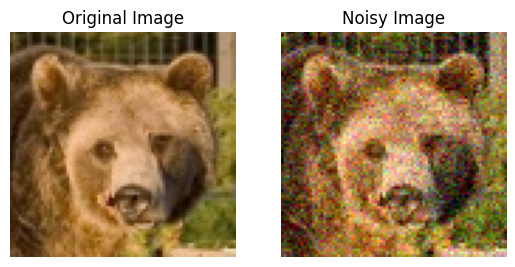

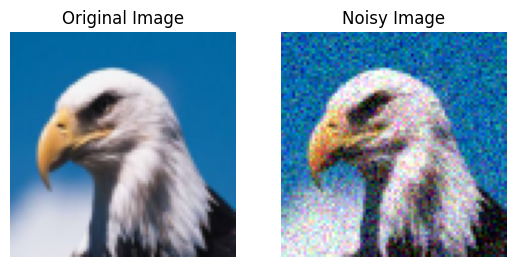

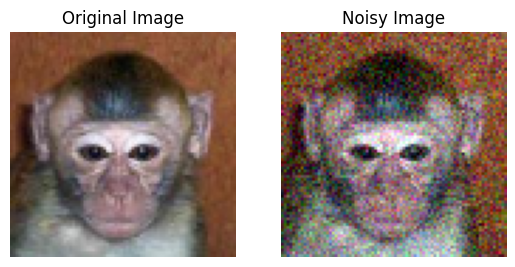

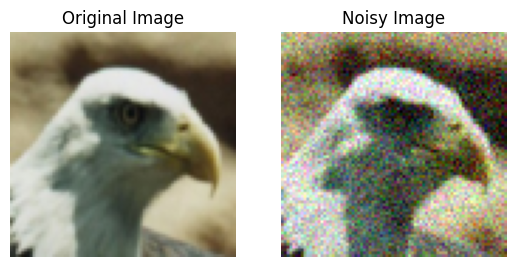

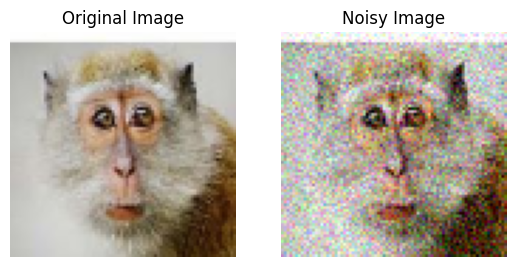

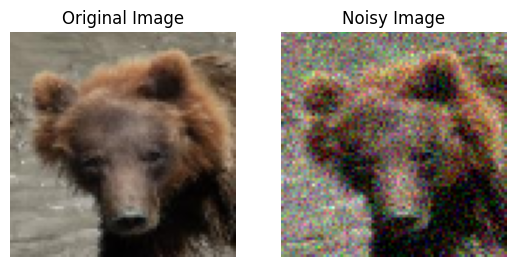

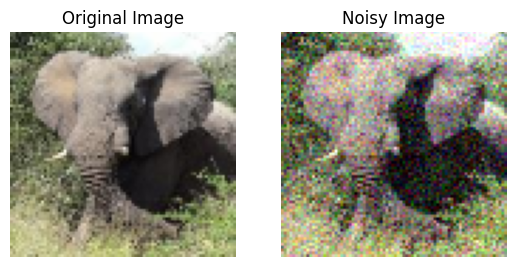

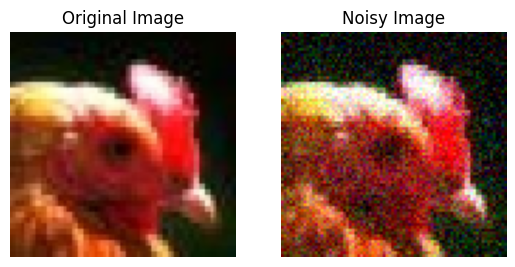

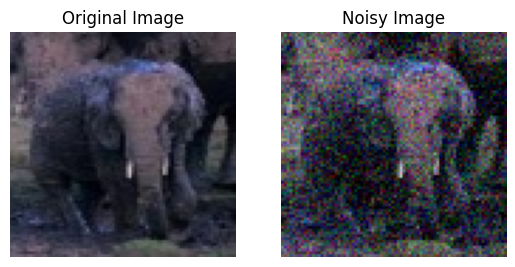

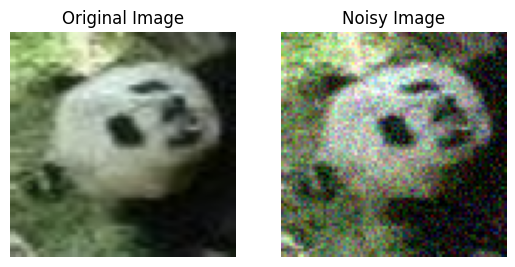

In [62]:
import numpy as np
import matplotlib.pyplot as plt

import joblib

# Load your images using joblib
# Assuming 'images' is a list of numpy arrays
images = joblib.load(f'{base_name}_{width}x{width}px.pkl')
images = np.array(images['data'])

def add_noise(image, noise_factor=0.1):
    noise = np.random.normal(loc=0, scale=noise_factor, size=image.shape)
    noisy_image = image + noise
    return np.clip(noisy_image, 0, 1)


# Add Gaussian noise to each image in the list
noisy_images = [add_noise(image) for image in images]

# Visualize original and noisy images
counter = 0
while True:          # real range -> len(images)
    if counter == 10:
      break
    else:
      counter += 1
    i = randint(0, len(noisy_images))
    plt.subplot(1, 2, 1)
    plt.imshow(images[i])
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(noisy_images[i])
    plt.title('Noisy Image')
    plt.axis('off')

    plt.show()


In [68]:
images = images.reshape(X.shape[0], -1)

noisy_images = np.array(noisy_images)
noisy_images = noisy_images.reshape(X.shape[0], -1)

In [80]:
X_train, X_test, y_train, y_test = train_test_split(noisy_images, images, test_size=0.2, random_state=42)

mlp = MLPRegressor(hidden_layer_sizes=(1024, 256, 128, 64),
                   max_iter=10000,
                   random_state=27,
                   activation="logistic")


In [81]:
mlp.fit(X_train, y_train)

MLPRegressor(activation='logistic', hidden_layer_sizes=(1024, 256, 128, 64),
             max_iter=10000, random_state=27)

In [93]:
denoised_images_flat = mlp.predict(X_test)

psnr_scores = [peak_signal_noise_ratio(original, denoised) for original, denoised in zip(images, denoised_images_flat)]


print(f"Mean PSNR: {np.mean(psnr_scores):.2f}")


Mean PSNR: 12.78


TypeError: ignored

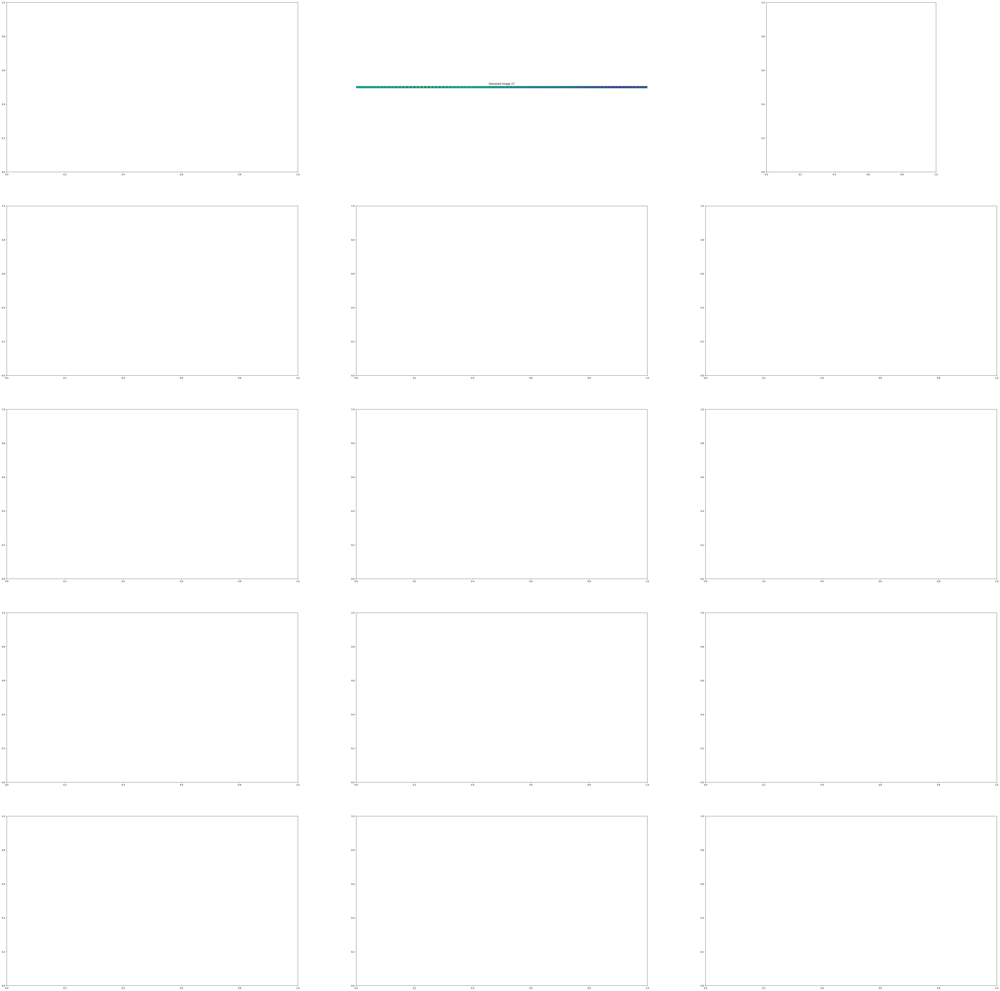

In [112]:
denoised_images = denoised_images_flat
test_noisy_images = X_test
test_actual_images = y_test


fig, axes = plt.subplots(5, 3, figsize=(80, 80))
axes = axes.ravel()

index, counter = 0, 0
while True:
    if counter == 10:
        break
    else:
        counter += 1
        index += 1
    i = randint(0, len(denoised_images_flat)-1)

    axes[index].imshow(denoised_images)
    axes[index].set_title(f"Denoised Image {i}")
    axes[index].axis('off')

    axes[index+1].imshow(test_noisy_images[i])
    axes[index+1].set_title(f"Noisy Image {i}")
    axes[index+1].axis('off')

    axes[index+2].imshow(test_actual_images[i])
    axes[index+2].set_title(f"Actual Image {i}")
    axes[index+2].axis('off')

plt.show()


In [103]:
print(X_test.shape)
print(y_test.shape)
print(denoised_images_flat.shape)
print(denoised_images.shape)

(144, 19200)
(144, 19200)
(144, 19200)
(144, 80, 80, 3)
